### kaggleから画像データをダウンロードする

In [1]:
# !kaggle competitions download -c dogs-vs-cats-redux-kernels-edition
# !unzip -q -n dogs-vs-cats-redux-kernels-edition.zip -d dogs_vs_cats
# !unzip -q -n dogs_vs_cats/train.zip -d dogs_vs_cats
# !unzip -q -n dogs_vs_cats/test.zip -d dogs_vs_cats

100%|████████████████████████████████████████| 814M/814M [00:52<00:00, 15.3MB/s]
100%|████████████████████████████████████████| 814M/814M [00:52<00:00, 16.4MB/s]


In [2]:
# !mkdir -p dogs_vs_cats/train/cat
# !mkdir -p dogs_vs_cats/train/dog
# !mkdir -p dogs_vs_cats/test/unknown
# !mv dogs_vs_cats/train/cat*.jpg dogs_vs_cats/train/cat
# !mv dogs_vs_cats/train/dog*.jpg dogs_vs_cats/train/dog
# !mv dogs_vs_cats/test/*.jpg dogs_vs_cats/test/unknown

### 必要なimport

In [3]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
import pathlib
from glob import glob
import numpy as np
import pandas as pd

### EDA
画像を表示してみてみる

In [4]:
# 画像を表示するメソッド
def display_100images(directory:pathlib.PosixPath):
    # ディレクトリから画像ファイルのリストを取得
    image_files = [os.path.join(directory, f) for f in os.listdir(directory) if f.endswith(('.png', '.jpg', '.jpeg'))]

    # 画像ファイルからランダムに100枚選択
    selected_images = random.sample(image_files, 100)

    # 画像を10x10のグリッドで表示
    fig, axes = plt.subplots(10, 10, figsize=(20, 20))
    for ax, img_path in zip(axes.flatten(), selected_images):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.axis('off')  # 軸をオフにする

    plt.tight_layout()
    plt.show()

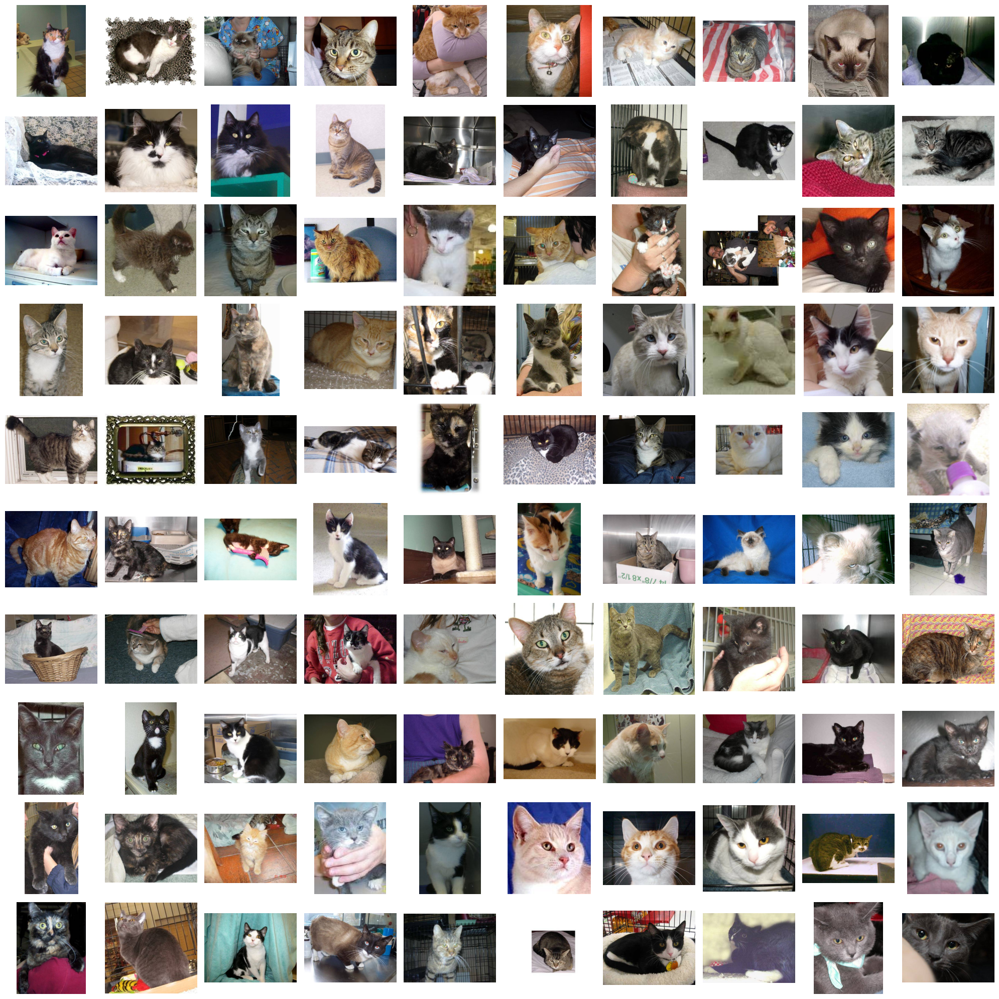

In [5]:
# train, cat
directory = "dogs_vs_cats/train/cat"
display_100images(directory)

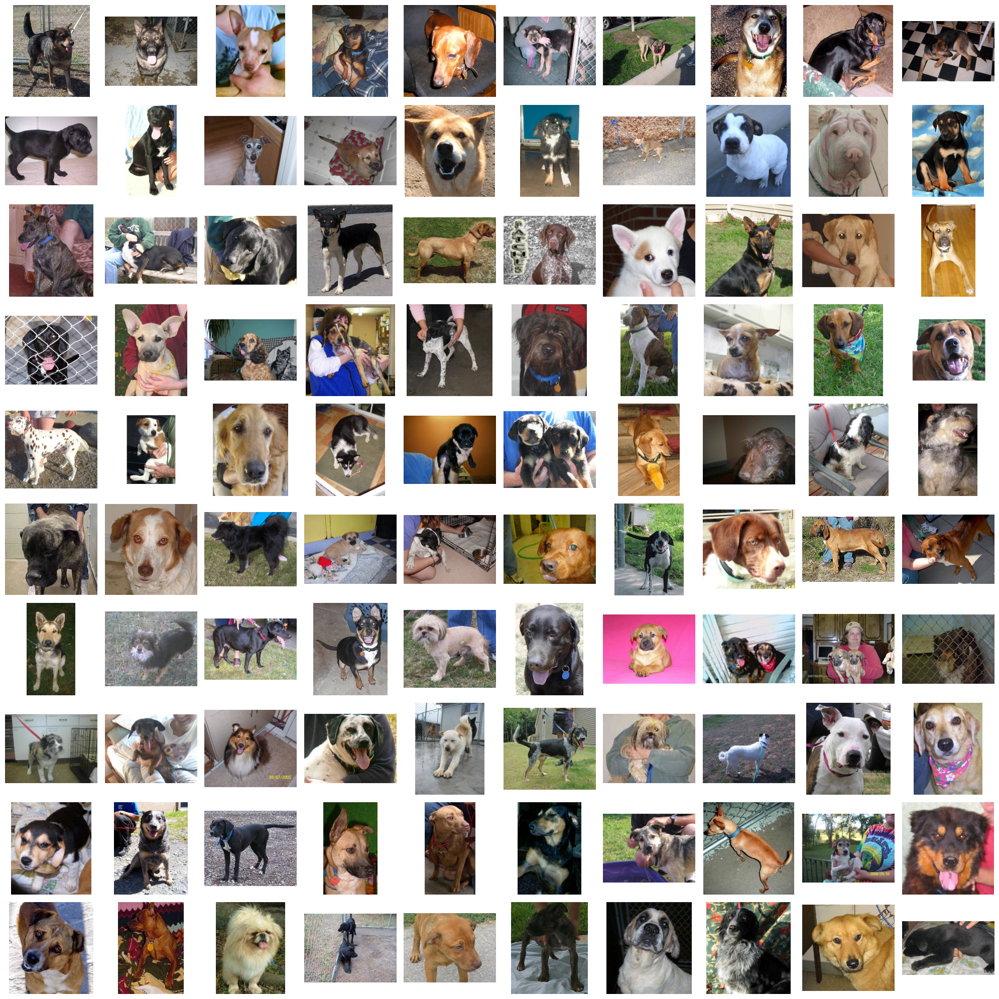

In [6]:
# train, dog
directory = "dogs_vs_cats/train/dog"
display_100images(directory)

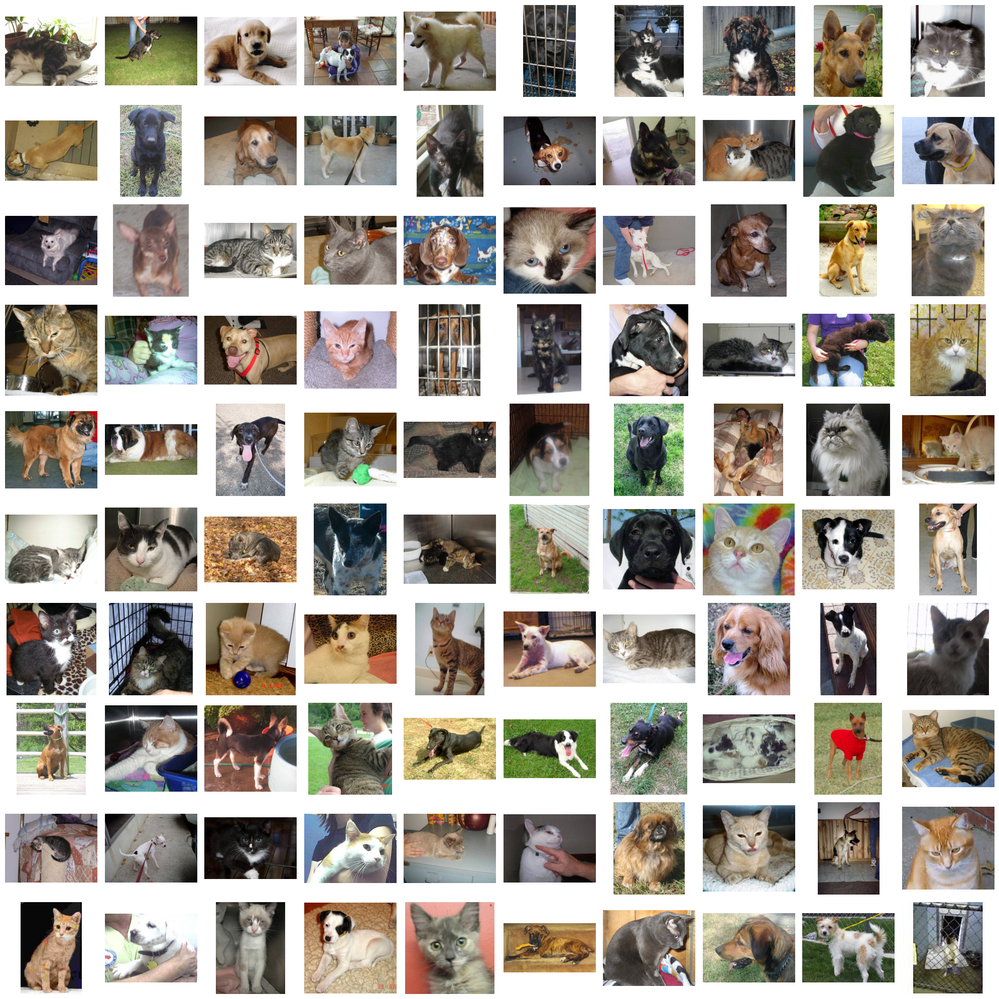

In [7]:
# test, unknown
directory = "dogs_vs_cats/test/unknown"
display_100images(directory)

カテゴリごとの枚数の比率を確認する

In [8]:
# 枚数の比率
train_cat_dir = "dogs_vs_cats/train/cat"
train_dog_dir = "dogs_vs_cats/train/dog"
test_dir = "dogs_vs_cats/test/unknown"
train_cat_paths = glob(os.path.join(train_cat_dir, "*"))
train_dog_paths = glob(os.path.join(train_dog_dir, "*"))
test_paths = glob(os.path.join(test_dir, "*"))

print("Train")
print(f"Cat: {len(train_cat_paths)} images, Dog: {len(train_dog_paths)} images")
print("Test")
print(f"Unknown: {len(test_paths)} images")

Train
Cat: 12500 images, Dog: 12500 images
Test
Unknown: 12500 images


画像サイズの分布を確認する

In [9]:
def get_image_size(image_path):
    """指定された画像ファイルのサイズを取得する関数"""
    with Image.open(image_path) as img:
        return np.array([img.size])  # shape=(1, 2)のnpaでサイズを返す (width, height)

train_cat_img_sizes = [get_image_size(path) for path in train_cat_paths]
train_dog_img_sizes = [get_image_size(path) for path in train_dog_paths]
test_img_sizes = [get_image_size(path) for path in test_paths]

train_cat_img_sizes = np.concatenate(train_cat_img_sizes, axis=0)
train_dog_img_sizes = np.concatenate(train_dog_img_sizes, axis=0)
test_img_sizes = np.concatenate(test_img_sizes, axis=0)

Text(0, 0.5, 'height')

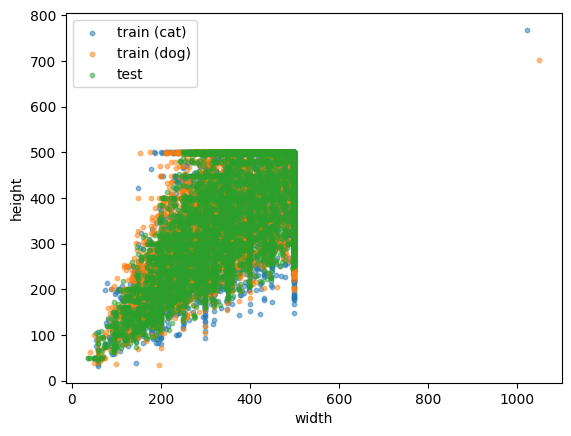

In [12]:
plt.scatter(train_cat_img_sizes[:, 0], train_cat_img_sizes[:, 1] ,s=10, alpha=0.5)
plt.scatter(train_dog_img_sizes[:, 0], train_dog_img_sizes[:, 1] ,s=10, alpha=0.5)
plt.scatter(test_img_sizes[:, 0], test_img_sizes[:, 1] ,s=10, alpha=0.5)
plt.legend(["train (cat)", "train (dog)", "test"])
plt.xlabel("width")
plt.ylabel("height")

統計量の取得

In [11]:
def print_stats(npa, category):
    mean = np.mean(npa, axis=0)
    median = np.median(npa, axis=0)
    var = np.var(npa, axis=0)
    max = np.max(npa, axis=0)
    min = np.min(npa, axis=0)

    # 統計データをデータフレームにまとめる
    data = {
        "Mean": [f"{mean[0]:.1f}, {mean[1]:.1f}"],
        "Median": [f"{median[0]:.1f}, {median[1]:.1f}"],
        "Variance": [f"{var[0]:.1f}, {var[1]:.1f}"],
        "Max": [f"{max[0]:.1f}, {max[1]:.1f}"],
        "Min": [f"{min[0]:.1f}, {min[1]:.1f}"]
    }
    df = pd.DataFrame(data, index=[category])
    return df

# 統計情報を表形式で表示
df_cat = print_stats(train_cat_img_sizes, "Train (Cat)")
df_dog = print_stats(train_dog_img_sizes, "Train (Dog)")
df_test = print_stats(test_img_sizes, "Test")

# 全てのデータを結合して表示
df_all = pd.concat([df_cat, df_dog, df_test])
df_all # (width, height)

,Mean,Median,Variance,Max,Min
Train (Cat),"410.5, 356.5","470.0, 374.0","11637.8, 9316.7","1023.0, 768.0","50.0, 32.0"
Train (Dog),"397.7, 364.5","423.0, 374.0","12057.3, 9476.2","1050.0, 702.0","42.0, 33.0"
Test,"404.2, 359.9","447.0, 374.0","11952.3, 9361.2","500.0, 500.0","37.0, 44.0"
